<a href="https://colab.research.google.com/github/rivuletsteph/TIAER/blob/main/streamflow_zarr21.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Streamflow from the National Water Model CONUS Retrospective Dataset channel output files in Zarr format
---
By Stephanie Brady and Emad Ahmed  
TIAER @ Tarleton State University    
March 13, 2023

Credits: 

[Rich Signell](https://github.com/rsignell-usgs)  
[Explore the National Water Model Reanalysis](https://nbviewer.org/gist/rsignell-usgs/78a4ce00360c65bc99764aa3e88a2493)

[James McCreight](https://github.com/jmccreight)  
[NWM v2.1 Retrospective Zarr Usage Example
](https://github.com/NCAR/rechunk_retro_nwm_v21/blob/main/notebooks/usage_example_streamflow_timeseries.ipynb)

The purpose of this notebook is to aquire National Water Model channel outputs ([NWM model output data version 2.1 in Zarr format](https://registry.opendata.aws/nwm-archive/)) for one reach, including:
* streamflow = River Flow (m3 s-1)










## To Begin
Visit the [OWP National Water Model Interactive Map](https://water.noaa.gov/map).   
This example will use ReachID `5512664`, which is the Brazos River near Glen Rose, Texas.   
Coordinates: 32.2404, -97.7120 

Import Packages

In [1]:
!pip install s3fs
!pip install zarr


import os
import pandas as pd
import numpy as np
import s3fs
import zarr
import fsspec
import xarray as xr
import plotly.graph_objects as go
from plotly.subplots import make_subplots


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 KB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 35.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.2/199.2 KB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 KB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 KB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 KB 7.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.3/203.3 KB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 71.4 MB/s eta 0:00:00
  Created wheel for asciitree: filename=

Create notebook output folder

In [2]:
!mkdir output
folder = os.getcwd()+'/output'

Identify the Reach ID (Refer to the section "To Begin").  
The Reach ID can be changed here.


In [3]:
reach_id=5512664

Setup Dask.distributed the [Easy Way](https://distributed.dask.org/en/stable/quickstart.html#setup-dask-distributed-the-easy-way)

In [4]:
from dask.distributed import Client, progress
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 2
Total threads: 2,Total memory: 12.68 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:41879,Workers: 2
Dashboard: http://127.0.0.1:8787/status,Total threads: 2
Started: Just now,Total memory: 12.68 GiB
Comm: tcp://127.0.0.1:45893,Total threads: 1
Dashboard: http://127.0.0.1:41323/status,Memory: 6.34 GiB
Nanny: tcp://127.0.0.1:39911,


Point to the AWS CLI (Amazon Web Services Command Line Interface) where the data is storred in Zarr format.

In [5]:
url = 's3://noaa-nwm-retrospective-2-1-zarr-pds/chrtout.zarr'

Print the [CPU Time and Wall Time](https://ipython.readthedocs.io/en/stable/interactive/magics.html?highlight=%25time#magic-time)  
Load and decode a dataset from the Zarr [store](https://docs.xarray.dev/en/stable/generated/xarray.open_zarr.html)  
Usually takes about 5 seconds

In [6]:
%%time
nwm_ds_hourly = xr.open_zarr(fsspec.get_mapper(url, anon=True), consolidated=True)

CPU times: user 2.63 s, sys: 332 ms, total: 2.96 s
Wall time: 8.51 s


Print the dataset description

In [7]:
nwm_ds_hourly

<xarray.Dataset>
Dimensions:     (feature_id: 2776738, time: 367439)
Coordinates:
    elevation   (feature_id) float32 dask.array<chunksize=(2776738,), meta=np.ndarray>
  * feature_id  (feature_id) int32 101 179 181 ... 1180001803 1180001804
    gage_id     (feature_id) |S15 dask.array<chunksize=(2776738,), meta=np.ndarray>
    latitude    (feature_id) float32 dask.array<chunksize=(2776738,), meta=np.ndarray>
    longitude   (feature_id) float32 dask.array<chunksize=(2776738,), meta=np.ndarray>
    order       (feature_id) int32 dask.array<chunksize=(2776738,), meta=np.ndarray>
  * time        (time) datetime64[ns] 1979-02-01T01:00:00 ... 2020-12-31T23:0...
Data variables:
    crs         |S1 ...
    streamflow  (time, feature_id) float64 dask.array<chunksize=(672, 30000), meta=np.ndarray>
    velocity    (time, feature_id) float64 dask.array<chunksize=(672, 30000), meta=np.ndarray>
Attributes:
    TITLE:                OUTPUT FROM WRF-Hydro v5.2.0-beta2
    code_version:         v5.2.0-beta2
    featureType:          timeSeries
    model_configuration:  retrospective
    proj4:                +proj=lcc +units=m +a=6370000.0 +b=6370000.0 +lat_1...

Identify what reach or reaches for which the NWM streamflows will be downloaded.

For multiple reaches, use the syntax "reaches = np.sort(np.array([x1,x2,...]))".

In [8]:
reach = np.sort(np.array([reach_id]))

Print the wall time.  
Extract the flow data for the specified reach and  time period.  
Typically takes about 3 mins.

In [9]:
%%time
nwm_ds_hourly_subset = nwm_ds_hourly.streamflow.sel(feature_id=reach).compute()

CPU times: user 24.2 s, sys: 2.19 s, total: 26.4 s
Wall time: 4min 25s


In [10]:
nwm_ds_hourly_subset

<xarray.DataArray 'streamflow' (time: 367439, feature_id: 1)>
array([[36.01999919],
       [36.01999919],
       [36.02999919],
       ...,
       [39.45999912],
       [39.67999911],
       [39.87999911]])
Coordinates:
    elevation   (feature_id) float32 173.6
  * feature_id  (feature_id) int32 5512664
    gage_id     (feature_id) |S15 b'               '
    latitude    (feature_id) float32 32.24
    longitude   (feature_id) float32 -97.68
    order       (feature_id) int32 7
  * time        (time) datetime64[ns] 1979-02-01T01:00:00 ... 2020-12-31T23:0...
Attributes:
    grid_mapping:  crs
    long_name:     River Flow
    units:         m3 s-1

Convert the dataset array into a dataframe.

In [11]:
raw_nwm_df= nwm_ds_hourly_subset.to_pandas()

In [12]:
raw_nwm_df

feature_id,5512664
time,
1979-02-01 01:00:00,36.019999
1979-02-01 02:00:00,36.019999
1979-02-01 03:00:00,36.029999
1979-02-01 04:00:00,36.039999
1979-02-01 05:00:00,36.049999
...,...
2020-12-31 19:00:00,38.979999
2020-12-31 20:00:00,39.219999
2020-12-31 21:00:00,39.459999


Create Hydrograph for the Raw NWM data (hourly)

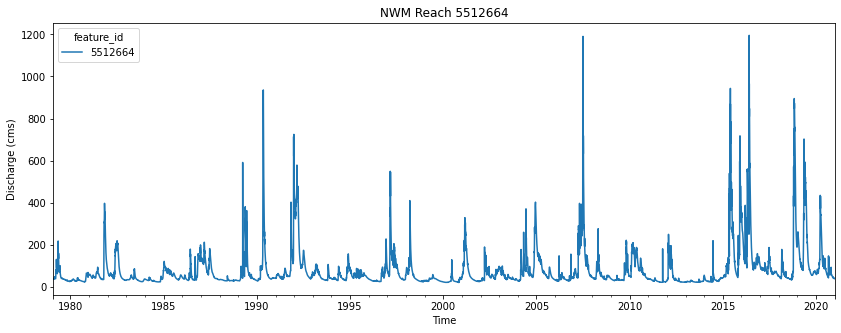

In [13]:
raw_nwm_df.plot(figsize=(14,5), title= "NWM Reach "+ str(reach_id), xlabel="Time", ylabel="Discharge (cms)");

Create a new index column

In [14]:
nwm_df=raw_nwm_df.reset_index()

Update the column names

In [15]:
nwm_df.rename({'time': 'Date_Time', reach_id: 'NWM_cms'}, axis=1, inplace=True)

Calulate discharge in CFS



In [16]:
nwm_df["NWM_cfs"] = nwm_df["NWM_cms"]*35.314666212661

In [17]:
nwm_df['Date_Time'] = nwm_df['Date_Time'].dt.tz_localize('UTC').dt.tz_convert('America/Chicago').dt.tz_localize(None)

Export wrangled NWM dataframe to a csv file

In [18]:
nwm_df

feature_id,Date_Time,NWM_cms,NWM_cfs
0,1979-01-31 19:00:00,36.019999,1272.034249
1,1979-01-31 20:00:00,36.019999,1272.034249
2,1979-01-31 21:00:00,36.029999,1272.387395
3,1979-01-31 22:00:00,36.039999,1272.740542
4,1979-01-31 23:00:00,36.049999,1273.093689
...,...,...,...
367434,2020-12-31 13:00:00,38.979999,1376.565658
367435,2020-12-31 14:00:00,39.219999,1385.041178
367436,2020-12-31 15:00:00,39.459999,1393.516698
367437,2020-12-31 16:00:00,39.679999,1401.285924


In [19]:
nwm_df.to_csv(folder +'/NWM_Data_for_' + str(reach_id)  + '.csv')

Export the table

Create the Plotly graph  
Typically takes about 10 seconds

In [20]:
flow_fig = go.Figure()

#flow_fig.add_trace(go.Scatter(x=nwm_df['Date_Time'], y=nwm_usgs_df['USGS_cfs'], name="USGS Station "+ str(gage_id),
            #             line = dict(color='blue', width=1.5 )))
flow_fig.add_trace(go.Scatter(x=nwm_df['Date_Time'], y=nwm_df['NWM_cfs'], name="NWM Reach "+str(reach_id),
                         line = dict(color='blue', width=1.5)))

flow_fig.update_layout(title="Daily streamflow at " +str(reach_id), 
                  yaxis_title='Discharge (cfs)')

flow_fig.show()